<a href="https://colab.research.google.com/github/Raja-18/deep_learning/blob/master/9_Optimization_algos(Momentum%2CNAG)_and_strategies(MiniBatch%2Cstochastic).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##Algorithms:
* vanila GD
* Momentum GD
* Nesterov Accelerated GD
## strategies:
* Mini-batch
* Batch (modified in Mini-Batch)
* Stochastic (modified in Mini-Batch)

## Outline

1. It contains a normal sigmoid neuron with GD class (not a network)
2. with this GD is modified as Momentum GD, NAG algorithms
3. with stategies of mini_batch with GD algorithm
4. we can modify mini_batch size to attain Batch(mini_batch size = no.of inputs) and stochastic(mini_batch size =1)


In [1]:
from mpl_toolkits.mplot3d import Axes3D  #for 3d ploting
import matplotlib.pyplot as plt

from matplotlib import cm
import matplotlib.colors

from matplotlib import animation, rc   #for animation
from IPython.display import HTML

import numpy as np
plt.style.use('seaborn')

In [2]:
class SN:                                    #single sigmoid neuron
  
  def __init__(self, w_init, b_init, algo):
    self.w = w_init                          #seting different initial points
    self.b = b_init
    self.w_h = []                            #history of w
    self.b_h = []                            #history of b
    self.e_h = []                            #history of error
    self.algo = algo
    
  def sigmoid(self, x, w=None, b=None):         #it also takes w and b # we can run sigmoid at specific w and b (NAG)
    if w is None:
      w = self.w
    if b is None:
      b = self.b
    return 1. / (1. + np.exp(-(w*x + b)))
  
  def error(self, X, Y, w=None, b=None):      #mean square error 
    if w is None:
      w = self.w
    if b is None:
      b = self.b
    err = 0
    for x, y in zip(X, Y):
      err += 0.5 * (self.sigmoid(x, w, b) - y) ** 2     #0.5-->1/2 to ensure there is no scalar terms
    return err
  
  def grad_w(self, x, y, w=None, b=None):
    if w is None:
      w = self.w
    if b is None:
      b = self.b
    y_pred = self.sigmoid(x, w, b)
    return (y_pred - y) * y_pred * (1 - y_pred) * x
  
  def grad_b(self, x, y, w=None, b=None):
    if w is None:
      w = self.w
    if b is None:
      b = self.b
    y_pred = self.sigmoid(x, w, b)
    return (y_pred - y) * y_pred * (1 - y_pred)
  
  def fit(self, X, Y, 
          epochs=100, eta=0.01, gamma=0.9, mini_batch_size=100, eps=1e-8,    #dont mind eps, beta,beta1,beta2 in this file
          beta=0.9, beta1=0.9, beta2=0.9
         ):
    self.w_h = []
    self.b_h = []
    self.e_h = []
    self.X = X
    self.Y = Y
    
    if self.algo == 'GD':             #normal Gradient descent
      for i in range(epochs):
        dw, db = 0, 0
        for x, y in zip(X, Y):
          dw += self.grad_w(x, y)
          db += self.grad_b(x, y)
        self.w -= eta * dw / X.shape[0]
        self.b -= eta * db / X.shape[0]
        self.append_log()                 #appending the current weightes to history
        
    elif self.algo == 'MiniBatch':
      for i in range(epochs):
        dw, db = 0, 0
        points_seen = 0
        for x, y in zip(X, Y):
          dw += self.grad_w(x, y)
          db += self.grad_b(x, y)
          points_seen += 1
          if points_seen % mini_batch_size == 0:
            self.w -= eta * dw / mini_batch_size
            self.b -= eta * db / mini_batch_size
            self.append_log()
            dw, db = 0, 0
        
    elif self.algo == 'Momentum':
      v_w, v_b = 0, 0
      for i in range(epochs):
        dw, db = 0, 0
        for x, y in zip(X, Y):
          dw += self.grad_w(x, y)
          db += self.grad_b(x, y)
        v_w = gamma * v_w + eta * dw 
        v_b = gamma * v_b + eta * db
        self.w = self.w - v_w
        self.b = self.b - v_b
        self.append_log()
        
    elif self.algo == 'NAG':
      v_w, v_b = 0, 0
      for i in range(epochs):
        dw, db = 0, 0
        v_w = gamma * v_w
        v_b = gamma * v_b
        for x, y in zip(X, Y):
          dw += self.grad_w(x, y, self.w - v_w, self.b - v_b)
          db += self.grad_b(x, y, self.w - v_w, self.b - v_b)
        v_w = v_w + eta * dw
        v_b = v_b + eta * db
        self.w = self.w - v_w
        self.b = self.b - v_b
        self.append_log()
        
  def append_log(self):
    self.w_h.append(self.w)
    self.b_h.append(self.b)
    self.e_h.append(self.error(self.X, self.Y))

### GD for 3d plot

In [3]:
X = np.asarray([0.5,2.5])   #setting 2 input 
Y = np.asarray([0.2,0.9])   #corresponding output

algo = 'GD'                 #algorithm to be used - vanila gradient descent

w_init = -2                 #learning algorithms starts with this (nort random it is deterministic)
b_init = -2

w_min = -7
w_max = 5

b_min = -5
b_max = 5

epochs = 1000        #epochs
eta = 1              #learning rate

animation_frames = 20       #actually we need 1000 frames for 1000 epochs, it is tedious to create 1000 frames so we create 20 frames
plot_2d = False              #2d plot using contour plot 
plot_3d = True

change the initial values of w and b to see the change in graphs and animation
* w_int=-3  b_int=4  it moves from start red to deep blue
* w_int = -5  b_int = 4 it gest stuck at some point without getting gradient from that point

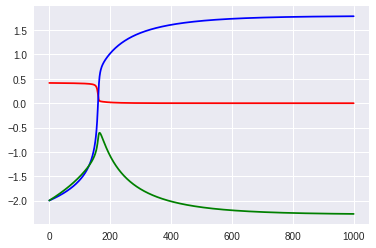

In [4]:
sn = SN(w_init, b_init, algo)           #initializing sigmoid 
sn.fit(X, Y, epochs=epochs, eta=eta)
plt.plot(sn.e_h, 'r')                   #hystory of error
plt.plot(sn.w_h, 'b')                   #hystory of w
plt.plot(sn.b_h, 'g')                   #hystory of b
plt.show()

In [5]:
def plot_animate_3d(i):                 #for func in animation
  i = int(i*(epochs/animation_frames))
  line1.set_data(sn.w_h[:i+1], sn.b_h[:i+1]) #sets x and y value for line 1
  line1.set_3d_properties(sn.e_h[:i+1])      #sets z value for line 1
  line2.set_data(sn.w_h[:i+1], sn.b_h[:i+1]) #sets x and y value for line 2
  line2.set_3d_properties(np.zeros(i+1) - 1) #sets z value for line 2
  title.set_text('Epoch: {: d}, Error: {:.4f}'.format(i, sn.e_h[i])) #displaying the text along the animation
  return line1, line2, title   #returning all those to the animation function 

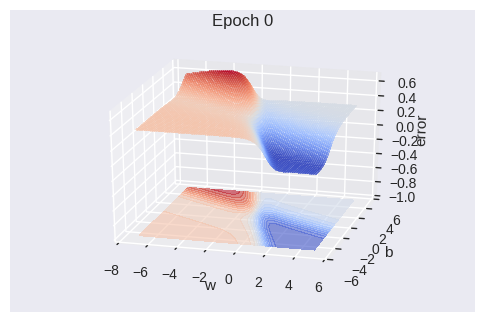

In [6]:
if plot_3d: 
  W = np.linspace(w_min, w_max, 256)    #for 3d plot we need a meshgid 
  b = np.linspace(b_min, b_max, 256)
  WW, BB = np.meshgrid(W, b)
  Z = sn.error(X, Y, WW, BB)            #w and b are external value initialised above

  fig = plt.figure(dpi=100)             #dots per image (more the quantity beter qualit of image)
  ax = fig.gca(projection='3d')         #for 3d plot 
  surf = ax.plot_surface(WW, BB, Z, rstride=3, cstride=3, alpha=0.5, cmap=cm.coolwarm, linewidth=0, antialiased=False) #3d surface plot
  cset = ax.contourf(WW, BB, Z, 25, zdir='z', offset=-1, alpha=0.6, cmap=cm.coolwarm)                                  #corresponding contour plot
  ax.set_xlabel('w')
  ax.set_xlim(w_min - 1, w_max + 1)
  ax.set_ylabel('b')
  ax.set_ylim(b_min - 1, b_max + 1)
  ax.set_zlabel('error')
  ax.set_zlim(-1, np.max(Z))
  ax.view_init (elev=25, azim=-75) # azim = -20   #from where do u see the plot(elivation , azimoth angle)
  ax.dist=12                                      #from what distance you r seeing the plot
  title = ax.set_title('Epoch 0')



3d plot is above and contour plot is down
the error should move from dark red to dark blue

In [7]:
if plot_3d: 
  i = 0
  line1, = ax.plot(sn.w_h[:i+1], sn.b_h[:i+1], sn.e_h[:i+1], color='black',marker='.')     #along the surface plot setting scatter plot
  line2, = ax.plot(sn.w_h[:i+1], sn.b_h[:i+1], np.zeros(i+1) - 1, color='red', marker='.') #along the contour plot seting scatter plot
  anim = animation.FuncAnimation(fig, func=plot_animate_3d, frames=animation_frames)       #animation video 
  rc('animation', html='jshtml')
  anim

In [8]:
if algo == 'GD':
  print('algo = {}, eta = {}'.format(algo, eta))
elif algo == 'Momentum' or algo == 'NAG':
  print('algo = {}, eta = {}, gamma = {}'.format(algo, eta, gamma))
elif algo == 'MiniBatch':
  print('algo = {}, eta = {}, batch size = {}'.format(algo, eta, mini_batch_size))
elif algo == 'AdaGrad' or algo == 'RMSProp':                        #dont mind adagrad and rmsprop in this file (can also erase this elif statement)
  print('algo = {}, eta = {}, eps = {}'.format(algo, eta, eps))
anim

algo = GD, eta = 1


### GD for 2d plot


In [9]:
X = np.asarray([0.5,2.5])   #setting 2 input 
Y = np.asarray([0.2,0.9])   #corresponding output

algo = 'GD'                 #algorithm to be used - vanila gradient descent

w_init = -5                 #learning algorithms starts with this (nort random it is deterministic)
b_init = 4

w_min = -7
w_max = 5

b_min = -5
b_max = 5

epochs = 1000        #epochs
eta = 1              #learning rate

animation_frames = 20       #actually we need 1000 frames for 1000 epochs, it is tedious to create 1000 frames so we create 20 frames
plot_2d = True              #2d plot using contour plot 
plot_3d = False

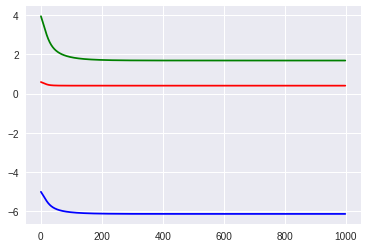

In [10]:
sn = SN(w_init, b_init, algo)           #initializing sigmoid 
sn.fit(X, Y, epochs=epochs, eta=eta)
plt.plot(sn.e_h, 'r')                   #hystory of error
plt.plot(sn.w_h, 'b')                   #hystory of w
plt.plot(sn.b_h, 'g')                   #hystory of b
plt.show()

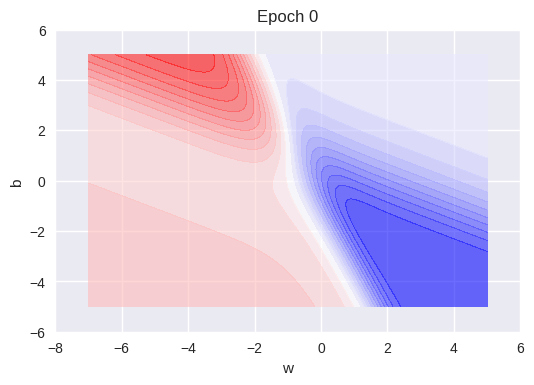

In [11]:
if plot_2d: 
  W = np.linspace(w_min, w_max, 256)
  b = np.linspace(b_min, b_max, 256)
  WW, BB = np.meshgrid(W, b)
  Z = sn.error(X, Y, WW, BB)

  fig = plt.figure(dpi=100)
  ax = plt.subplot(111)
  ax.set_xlabel('w')
  ax.set_xlim(w_min - 1, w_max + 1)
  ax.set_ylabel('b')
  ax.set_ylim(b_min - 1, b_max + 1)
  title = ax.set_title('Epoch 0')
  cset = plt.contourf(WW, BB, Z, 25, alpha=0.6, cmap=cm.bwr)
  plt.show()

In [12]:
def plot_animate_2d(i):
  i = int(i*(epochs/animation_frames))
  line.set_data(sn.w_h[:i+1], sn.b_h[:i+1])
  title.set_text('Epoch: {: d}, Error: {:.4f}'.format(i, sn.e_h[i]))
  return line, title

In [13]:
if plot_2d: 
  i = 0
  line, = ax.plot(sn.w_h[:i+1], sn.b_h[:i+1], color='black',marker='.')
  anim = animation.FuncAnimation(fig, func=plot_animate_2d, frames=animation_frames)
  rc('animation', html='jshtml')
  anim

In [14]:
if algo == 'GD':
  print('algo = {}, eta = {}'.format(algo, eta))
elif algo == 'Momentum' or algo == 'NAG':
  print('algo = {}, eta = {}, gamma = {}'.format(algo, eta, gamma))
elif algo == 'MiniBatch':
  print('algo = {}, eta = {}, batch size = {}'.format(algo, eta, mini_batch_size))
elif algo == 'AdaGrad' or algo == 'RMSProp':
  print('algo = {}, eta = {}, eps = {}'.format(algo, eta, eps))
anim

algo = GD, eta = 1


can see here it getting stuck at a point if we initialise w=-5 and b=4

### Momentum GD 3d plot
$\nu_t=\gamma\cdot\nu_{t-1}+\eta\bigtriangledown
\omega_t$ 

$\omega_{t+1}=\omega_t-\nu_t$

In [39]:
X = np.asarray([3.5,0.35,3.2])   #setting 2 input 
Y = np.asarray([0.49,0.53,0.52])   #corresponding output

algo = 'Momentum'                 #algorithm to be used - vanila gradient descent

w_init = 2.1                #learning algorithms starts with this (nort random it is deterministic)
b_init = 4.0

w_min = -7
w_max = 5

b_min = -5
b_max = 5

epochs = 100        #epochs
eta = 1              #learning rate
gamma = 0.8

animation_frames = 20       #actually we need 1000 frames for 1000 epochs, it is tedious to create 1000 frames so we create 20 frames
plot_2d = False              #2d plot using contour plot 
plot_3d = True

try out different initialisation in w and b and compare GD with momentum GD
* w_init = -4 b_init = 0
* b_init = -3 b_init = 4

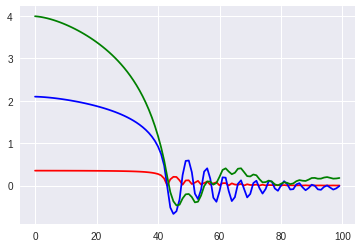

In [40]:
sn = SN(w_init, b_init, algo)           #initializing sigmoid 
sn.fit(X, Y, epochs=epochs, eta=eta)
plt.plot(sn.e_h, 'r')                   #hystory of error
plt.plot(sn.w_h, 'b')                   #hystory of w
plt.plot(sn.b_h, 'g')                   #hystory of b
plt.show()

In [41]:
def plot_animate_3d(i):                 #for func in animation
  i = int(i*(epochs/animation_frames))
  line1.set_data(sn.w_h[:i+1], sn.b_h[:i+1]) #sets x and y value for line 1
  line1.set_3d_properties(sn.e_h[:i+1])      #sets z value for line 1
  line2.set_data(sn.w_h[:i+1], sn.b_h[:i+1]) #sets x and y value for line 2
  line2.set_3d_properties(np.zeros(i+1) - 1) #sets z value for line 2
  title.set_text('Epoch: {: d}, Error: {:.4f}'.format(i, sn.e_h[i])) #displaying the text along the animation
  return line1, line2, title   #returning all those to the animation function 

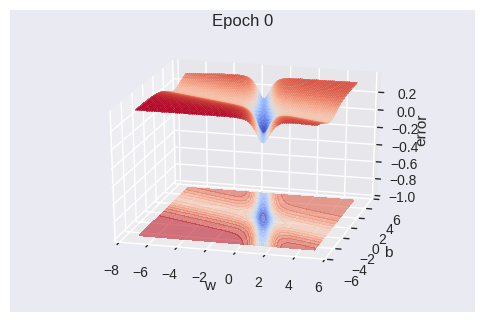

In [42]:
if plot_3d: 
  W = np.linspace(w_min, w_max, 256)    #for 3d plot we need a meshgid 
  b = np.linspace(b_min, b_max, 256)
  WW, BB = np.meshgrid(W, b)
  Z = sn.error(X, Y, WW, BB)            #w and b are external value initialised above

  fig = plt.figure(dpi=100)             #dots per image (more the quantity beter qualit of image)
  ax = fig.gca(projection='3d')         #for 3d plot 
  surf = ax.plot_surface(WW, BB, Z, rstride=3, cstride=3, alpha=0.5, cmap=cm.coolwarm, linewidth=0, antialiased=False) #3d surface plot
  cset = ax.contourf(WW, BB, Z, 25, zdir='z', offset=-1, alpha=0.6, cmap=cm.coolwarm)                                  #corresponding contour plot
  ax.set_xlabel('w')
  ax.set_xlim(w_min - 1, w_max + 1)
  ax.set_ylabel('b')
  ax.set_ylim(b_min - 1, b_max + 1)
  ax.set_zlabel('error')
  ax.set_zlim(-1, np.max(Z))
  ax.view_init (elev=25, azim=-75) # azim = -20   #from where do u see the plot(elivation , azimoth angle)
  ax.dist=12                                      #from what distance you r seeing the plot
  title = ax.set_title('Epoch 0')

In [43]:
if plot_3d: 
  i = 0
  line1, = ax.plot(sn.w_h[:i+1], sn.b_h[:i+1], sn.e_h[:i+1], color='black',marker='.')     #along the surface plot setting scatter plot
  line2, = ax.plot(sn.w_h[:i+1], sn.b_h[:i+1], np.zeros(i+1) - 1, color='red', marker='.') #along the contour plot seting scatter plot
  anim = animation.FuncAnimation(fig, func=plot_animate_3d, frames=animation_frames)       #animation video 
  rc('animation', html='jshtml')
  anim

In [44]:
if algo == 'GD':
  print('algo = {}, eta = {}'.format(algo, eta))
elif algo == 'Momentum' or algo == 'NAG':
  print('algo = {}, eta = {}, gamma = {}'.format(algo, eta, gamma))
elif algo == 'MiniBatch':
  print('algo = {}, eta = {}, batch size = {}'.format(algo, eta, mini_batch_size))
elif algo == 'AdaGrad' or algo == 'RMSProp':
  print('algo = {}, eta = {}, eps = {}'.format(algo, eta, eps))
anim

algo = Momentum, eta = 1, gamma = 0.8


### Momentum GD 2d plot

In [52]:
X = np.asarray([3.5,0.35,3.2])   #setting 3 input             #check with the GD inputs given above(2 inputs)
Y = np.asarray([0.49,0.53,0.52])   #corresponding output

algo = 'Momentum'                 #algorithm to be used - vanila gradient descent

w_init = 2.1                 #learning algorithms starts with this (nort random it is deterministic)
b_init = 4.0

w_min = -7
w_max = 5

b_min = -5
b_max = 5

epochs = 100        #epochs
eta = 1              #learning rate

animation_frames = 20       #actually we need 1000 frames for 1000 epochs, it is tedious to create 1000 frames so we create 20 frames
plot_2d = True              #2d plot using contour plot 
plot_3d = False

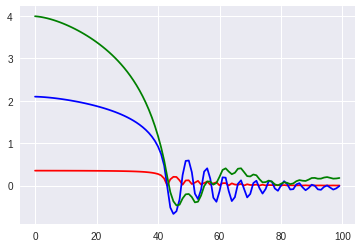

In [53]:
sn = SN(w_init, b_init, algo)           #initializing sigmoid 
sn.fit(X, Y, epochs=epochs, eta=eta)
plt.plot(sn.e_h, 'r')                   #hystory of error
plt.plot(sn.w_h, 'b')                   #hystory of w
plt.plot(sn.b_h, 'g')                   #hystory of b
plt.show()

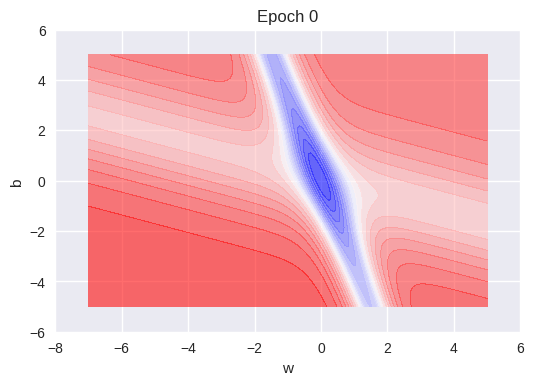

In [54]:
if plot_2d: 
  W = np.linspace(w_min, w_max, 256)
  b = np.linspace(b_min, b_max, 256)
  WW, BB = np.meshgrid(W, b)
  Z = sn.error(X, Y, WW, BB)

  fig = plt.figure(dpi=100)
  ax = plt.subplot(111)
  ax.set_xlabel('w')
  ax.set_xlim(w_min - 1, w_max + 1)
  ax.set_ylabel('b')
  ax.set_ylim(b_min - 1, b_max + 1)
  title = ax.set_title('Epoch 0')
  cset = plt.contourf(WW, BB, Z, 25, alpha=0.6, cmap=cm.bwr)
  plt.show()

In [55]:
def plot_animate_2d(i):
  i = int(i*(epochs/animation_frames))
  line.set_data(sn.w_h[:i+1], sn.b_h[:i+1])
  title.set_text('Epoch: {: d}, Error: {:.4f}'.format(i, sn.e_h[i]))
  return line, title

In [56]:
if plot_2d: 
  i = 0
  line, = ax.plot(sn.w_h[:i+1], sn.b_h[:i+1], color='black',marker='.')
  anim = animation.FuncAnimation(fig, func=plot_animate_2d, frames=animation_frames)
  rc('animation', html='jshtml')
  anim

In [57]:
if algo == 'GD':
  print('algo = {}, eta = {}'.format(algo, eta))
elif algo == 'Momentum' or algo == 'NAG':
  print('algo = {}, eta = {}, gamma = {}'.format(algo, eta, gamma))
elif algo == 'MiniBatch':
  print('algo = {}, eta = {}, batch size = {}'.format(algo, eta, mini_batch_size))
elif algo == 'AdaGrad' or algo == 'RMSProp':
  print('algo = {}, eta = {}, eps = {}'.format(algo, eta, eps))
anim

algo = Momentum, eta = 1, gamma = 0.8


it oscillates at the end 

###Nestrov accelerated GD 3d Plot
$\omega_{temp}=\omega_t-\gamma*\nu_{t-1}$

$\omega_{t+1}=\omega_{temp}-\eta\bigtriangledown\omega_{temp}$

$\nu=\gamma*\nu_{t-1}+\eta\bigtriangledown\omega_{temp}$

In [59]:
X = np.asarray([3.5,0.35,3.2])   #setting 2 input 
Y = np.asarray([0.49,0.53,0.52])   #corresponding output

algo = 'NAG'                 #algorithm to be used - vanila gradient descent

w_init = 2.1                 #learning algorithms starts with this (nort random it is deterministic)
b_init = 4.0

w_min = -7
w_max = 5

b_min = -5
b_max = 5

epochs = 100        #epochs
gamma = 0.8
eta = 1             #learning rate

animation_frames = 20       #actually we need 1000 frames for 1000 epochs, it is tedious to create 1000 frames so we create 20 frames
plot_2d = False              #2d plot using contour plot 
plot_3d = True

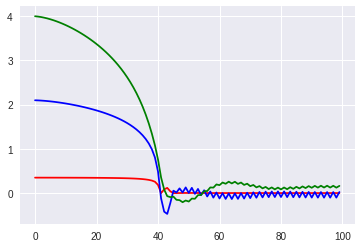

In [60]:
sn = SN(w_init, b_init, algo)           #initializing sigmoid 
sn.fit(X, Y, epochs=epochs, eta=eta)
plt.plot(sn.e_h, 'r')                   #hystory of error
plt.plot(sn.w_h, 'b')                   #hystory of w
plt.plot(sn.b_h, 'g')                   #hystory of b
plt.show()

In [61]:
def plot_animate_3d(i):                 #for func in animation
  i = int(i*(epochs/animation_frames))
  line1.set_data(sn.w_h[:i+1], sn.b_h[:i+1]) #sets x and y value for line 1
  line1.set_3d_properties(sn.e_h[:i+1])      #sets z value for line 1
  line2.set_data(sn.w_h[:i+1], sn.b_h[:i+1]) #sets x and y value for line 2
  line2.set_3d_properties(np.zeros(i+1) - 1) #sets z value for line 2
  title.set_text('Epoch: {: d}, Error: {:.4f}'.format(i, sn.e_h[i])) #displaying the text along the animation
  return line1, line2, title   #returning all those to the animation function 

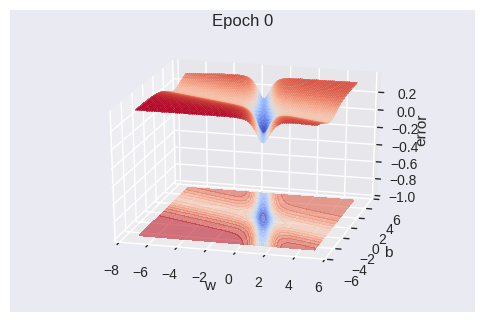

In [62]:
if plot_3d: 
  W = np.linspace(w_min, w_max, 256)    #for 3d plot we need a meshgid 
  b = np.linspace(b_min, b_max, 256)
  WW, BB = np.meshgrid(W, b)
  Z = sn.error(X, Y, WW, BB)            #w and b are external value initialised above

  fig = plt.figure(dpi=100)             #dots per image (more the quantity beter qualit of image)
  ax = fig.gca(projection='3d')         #for 3d plot 
  surf = ax.plot_surface(WW, BB, Z, rstride=3, cstride=3, alpha=0.5, cmap=cm.coolwarm, linewidth=0, antialiased=False) #3d surface plot
  cset = ax.contourf(WW, BB, Z, 25, zdir='z', offset=-1, alpha=0.6, cmap=cm.coolwarm)                                  #corresponding contour plot
  ax.set_xlabel('w')
  ax.set_xlim(w_min - 1, w_max + 1)
  ax.set_ylabel('b')
  ax.set_ylim(b_min - 1, b_max + 1)
  ax.set_zlabel('error')
  ax.set_zlim(-1, np.max(Z))
  ax.view_init (elev=25, azim=-75) # azim = -20   #from where do u see the plot(elivation , azimoth angle)
  ax.dist=12                                      #from what distance you r seeing the plot
  title = ax.set_title('Epoch 0')

In [63]:
if plot_3d: 
  i = 0
  line1, = ax.plot(sn.w_h[:i+1], sn.b_h[:i+1], sn.e_h[:i+1], color='black',marker='.')     #along the surface plot setting scatter plot
  line2, = ax.plot(sn.w_h[:i+1], sn.b_h[:i+1], np.zeros(i+1) - 1, color='red', marker='.') #along the contour plot seting scatter plot
  anim = animation.FuncAnimation(fig, func=plot_animate_3d, frames=animation_frames)       #animation video 
  rc('animation', html='jshtml')
  anim

In [64]:
if algo == 'GD':
  print('algo = {}, eta = {}'.format(algo, eta))
elif algo == 'Momentum' or algo == 'NAG':
  print('algo = {}, eta = {}, gamma = {}'.format(algo, eta, gamma))
elif algo == 'MiniBatch':
  print('algo = {}, eta = {}, batch size = {}'.format(algo, eta, mini_batch_size))
elif algo == 'AdaGrad' or algo == 'RMSProp':
  print('algo = {}, eta = {}, eps = {}'.format(algo, eta, eps))
anim

algo = NAG, eta = 1, gamma = 0.8


###Nestrov Accelerated GD 2d plot

In [65]:
X = np.asarray([3.5,0.35,3.2])   #setting 2 input 
Y = np.asarray([0.49,0.53,0.52])   #corresponding output

algo = 'NAG'                 #algorithm to be used - vanila gradient descent

w_init = 2.1                 #learning algorithms starts with this (nort random it is deterministic)
b_init = 4.0

w_min = -7
w_max = 5

b_min = -5
b_max = 5

epochs = 100        #epochs
gamma = 0.8
eta = 1             #learning rate

animation_frames = 20       #actually we need 1000 frames for 1000 epochs, it is tedious to create 1000 frames so we create 20 frames
plot_2d = True              #2d plot using contour plot 
plot_3d = False

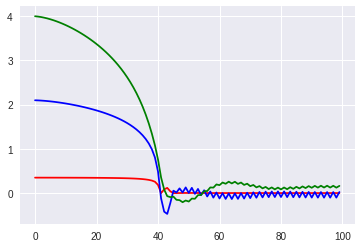

In [66]:
sn = SN(w_init, b_init, algo)           #initializing sigmoid 
sn.fit(X, Y, epochs=epochs, eta=eta)
plt.plot(sn.e_h, 'r')                   #hystory of error
plt.plot(sn.w_h, 'b')                   #hystory of w
plt.plot(sn.b_h, 'g')                   #hystory of b
plt.show()

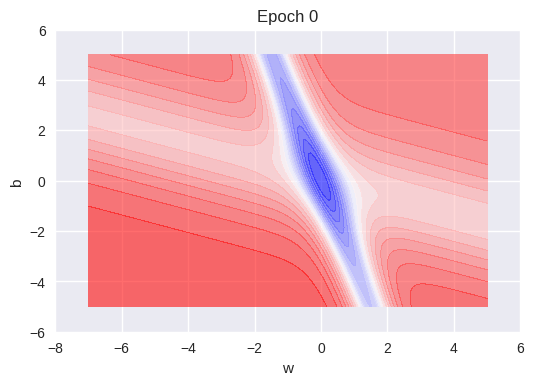

In [67]:
if plot_2d: 
  W = np.linspace(w_min, w_max, 256)
  b = np.linspace(b_min, b_max, 256)
  WW, BB = np.meshgrid(W, b)
  Z = sn.error(X, Y, WW, BB)

  fig = plt.figure(dpi=100)
  ax = plt.subplot(111)
  ax.set_xlabel('w')
  ax.set_xlim(w_min - 1, w_max + 1)
  ax.set_ylabel('b')
  ax.set_ylim(b_min - 1, b_max + 1)
  title = ax.set_title('Epoch 0')
  cset = plt.contourf(WW, BB, Z, 25, alpha=0.6, cmap=cm.bwr)
  plt.show()

In [68]:
def plot_animate_2d(i):
  i = int(i*(epochs/animation_frames))
  line.set_data(sn.w_h[:i+1], sn.b_h[:i+1])
  title.set_text('Epoch: {: d}, Error: {:.4f}'.format(i, sn.e_h[i]))
  return line, title

In [69]:
if plot_2d: 
  i = 0
  line, = ax.plot(sn.w_h[:i+1], sn.b_h[:i+1], color='black',marker='.')
  anim = animation.FuncAnimation(fig, func=plot_animate_2d, frames=animation_frames)
  rc('animation', html='jshtml')
  anim

In [70]:
if algo == 'GD':
  print('algo = {}, eta = {}'.format(algo, eta))
elif algo == 'Momentum' or algo == 'NAG':
  print('algo = {}, eta = {}, gamma = {}'.format(algo, eta, gamma))
elif algo == 'MiniBatch':
  print('algo = {}, eta = {}, batch size = {}'.format(algo, eta, mini_batch_size))
elif algo == 'AdaGrad' or algo == 'RMSProp':
  print('algo = {}, eta = {}, eps = {}'.format(algo, eta, eps))
anim

algo = NAG, eta = 1, gamma = 0.8


oscillations at the end is low when compared to momentum

### MiniBatch GD 3d plot

In [95]:
X = np.asarray([3.5,0.35,3.2,-2.0,1.5,-0.5])   #setting 2 input 
Y = np.asarray([0.5,0.50,0.5,0.5,0.1,0.3])   #corresponding output

algo = 'MiniBatch'                 #algorithm to be used - vanila gradient descent

w_init = 2.1                 #learning algorithms starts with this (nort random it is deterministic)
b_init = 4.0

w_min = -7
w_max = 5

b_min = -7
b_max = 5

epochs = 200        #epochs
mini_batch_size=3
gamma = 0.9
eta = 5             #learning rate

animation_frames = 20       #actually we need 1000 frames for 1000 epochs, it is tedious to create 1000 frames so we create 20 frames
plot_2d = False              #2d plot using contour plot 
plot_3d = True

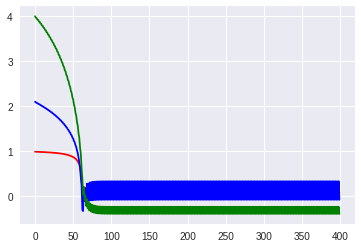

In [96]:
sn = SN(w_init, b_init, algo)           #initializing sigmoid 
sn.fit(X, Y, epochs=epochs, eta=eta,gamma=gamma,mini_batch_size=mini_batch_size)
plt.plot(sn.e_h, 'r')                   #hystory of error
plt.plot(sn.w_h, 'b')                   #hystory of w
plt.plot(sn.b_h, 'g')                   #hystory of b
plt.show()

In [97]:
def plot_animate_3d(i):                 #for func in animation
  i = int(i*(epochs/animation_frames))
  line1.set_data(sn.w_h[:i+1], sn.b_h[:i+1]) #sets x and y value for line 1
  line1.set_3d_properties(sn.e_h[:i+1])      #sets z value for line 1
  line2.set_data(sn.w_h[:i+1], sn.b_h[:i+1]) #sets x and y value for line 2
  line2.set_3d_properties(np.zeros(i+1) - 1) #sets z value for line 2
  title.set_text('Epoch: {: d}, Error: {:.4f}'.format(i, sn.e_h[i])) #displaying the text along the animation
  return line1, line2, title   #returning all those to the animation function 

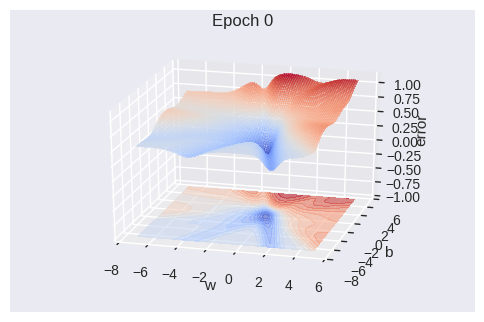

In [98]:
if plot_3d: 
  W = np.linspace(w_min, w_max, 256)    #for 3d plot we need a meshgid 
  b = np.linspace(b_min, b_max, 256)
  WW, BB = np.meshgrid(W, b)
  Z = sn.error(X, Y, WW, BB)            #w and b are external value initialised above

  fig = plt.figure(dpi=100)             #dots per image (more the quantity beter qualit of image)
  ax = fig.gca(projection='3d')         #for 3d plot 
  surf = ax.plot_surface(WW, BB, Z, rstride=3, cstride=3, alpha=0.5, cmap=cm.coolwarm, linewidth=0, antialiased=False) #3d surface plot
  cset = ax.contourf(WW, BB, Z, 25, zdir='z', offset=-1, alpha=0.6, cmap=cm.coolwarm)                                  #corresponding contour plot
  ax.set_xlabel('w')
  ax.set_xlim(w_min - 1, w_max + 1)
  ax.set_ylabel('b')
  ax.set_ylim(b_min - 1, b_max + 1)
  ax.set_zlabel('error')
  ax.set_zlim(-1, np.max(Z))
  ax.view_init (elev=25, azim=-75) # azim = -20   #from where do u see the plot(elivation , azimoth angle)
  ax.dist=12                                      #from what distance you r seeing the plot
  title = ax.set_title('Epoch 0')

In [99]:
if plot_3d: 
  i = 0
  line1, = ax.plot(sn.w_h[:i+1], sn.b_h[:i+1], sn.e_h[:i+1], color='black',marker='.')     #along the surface plot setting scatter plot
  line2, = ax.plot(sn.w_h[:i+1], sn.b_h[:i+1], np.zeros(i+1) - 1, color='red', marker='.') #along the contour plot seting scatter plot
  anim = animation.FuncAnimation(fig, func=plot_animate_3d, frames=animation_frames)       #animation video 
  rc('animation', html='jshtml')
  anim

In [100]:
if algo == 'GD':
  print('algo = {}, eta = {}'.format(algo, eta))
elif algo == 'Momentum' or algo == 'NAG':
  print('algo = {}, eta = {}, gamma = {}'.format(algo, eta, gamma))
elif algo == 'MiniBatch':
  print('algo = {}, eta = {}, batch size = {}'.format(algo, eta, mini_batch_size))
elif algo == 'AdaGrad' or algo == 'RMSProp':
  print('algo = {}, eta = {}, eps = {}'.format(algo, eta, eps))
anim

algo = MiniBatch, eta = 5, batch size = 3


### MiniBatch 2d plot

In [101]:
X = np.asarray([3.5,0.35,3.2,-2.0,1.5,-0.5])   #setting 2 input 
Y = np.asarray([0.5,0.50,0.5,0.5,0.1,0.3])   #corresponding output

algo = 'MiniBatch'                 #algorithm to be used - vanila gradient descent

w_init = 2.1                 #learning algorithms starts with this (nort random it is deterministic)
b_init = 4.0

w_min = -7
w_max = 5

b_min = -7
b_max = 5

epochs = 200        #epochs
mini_batch_size=3
gamma = 0.9
eta = 5            #learning rate

animation_frames = 20       #actually we need 1000 frames for 1000 epochs, it is tedious to create 1000 frames so we create 20 frames
plot_2d = True              #2d plot using contour plot 
plot_3d = False

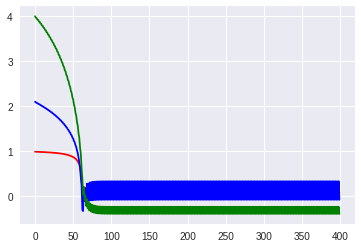

In [102]:
sn = SN(w_init, b_init, algo)           #initializing sigmoid 
sn.fit(X, Y, epochs=epochs, eta=eta,gamma=gamma,mini_batch_size=mini_batch_size)
plt.plot(sn.e_h, 'r')                   #hystory of error
plt.plot(sn.w_h, 'b')                   #hystory of w
plt.plot(sn.b_h, 'g')                   #hystory of b
plt.show()

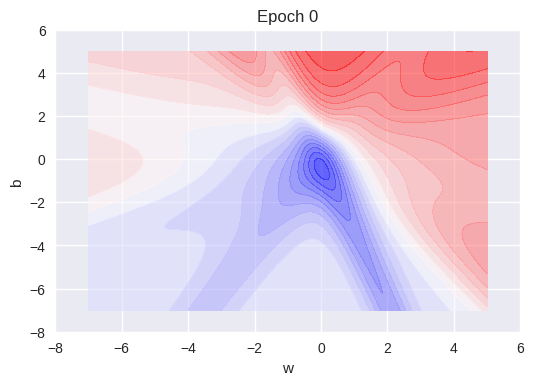

In [103]:
if plot_2d: 
  W = np.linspace(w_min, w_max, 256)
  b = np.linspace(b_min, b_max, 256)
  WW, BB = np.meshgrid(W, b)
  Z = sn.error(X, Y, WW, BB)

  fig = plt.figure(dpi=100)
  ax = plt.subplot(111)
  ax.set_xlabel('w')
  ax.set_xlim(w_min - 1, w_max + 1)
  ax.set_ylabel('b')
  ax.set_ylim(b_min - 1, b_max + 1)
  title = ax.set_title('Epoch 0')
  cset = plt.contourf(WW, BB, Z, 25, alpha=0.6, cmap=cm.bwr)
  plt.show()

In [104]:
def plot_animate_2d(i):
  i = int(i*(epochs/animation_frames))
  line.set_data(sn.w_h[:i+1], sn.b_h[:i+1])
  title.set_text('Epoch: {: d}, Error: {:.4f}'.format(i, sn.e_h[i]))
  return line, title

In [105]:
if plot_2d: 
  i = 0
  line, = ax.plot(sn.w_h[:i+1], sn.b_h[:i+1], color='black',marker='.')
  anim = animation.FuncAnimation(fig, func=plot_animate_2d, frames=animation_frames)
  rc('animation', html='jshtml')
  anim

In [106]:
if algo == 'GD':
  print('algo = {}, eta = {}'.format(algo, eta))
elif algo == 'Momentum' or algo == 'NAG':
  print('algo = {}, eta = {}, gamma = {}'.format(algo, eta, gamma))
elif algo == 'MiniBatch':
  print('algo = {}, eta = {}, batch size = {}'.format(algo, eta, mini_batch_size))
elif algo == 'AdaGrad' or algo == 'RMSProp':
  print('algo = {}, eta = {}, eps = {}'.format(algo, eta, eps))
anim

algo = MiniBatch, eta = 5, batch size = 3


* batch sized of 1 means it is a stochastic GD

* heare batch size is 3, updating with  more batch leads to high oscillation (highly noise) to reduse the noise increase the batch size (make mini batch size as 6 and see, it will become normal GD algorithm because the input data given is 6)